In [2]:
import scvi
import os
import tempfile
import scanpy as sc
import scarches as sca
import seaborn as sns
import torch
from rich import print
import numpy as np
import matplotlib.pyplot as plt

/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


In [3]:
torch.set_float32_matmul_precision('high')

In [5]:
ref_adata = sc.read("/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/scanvi_couturier/couturier.h5ad")
ref_adata

AnnData object with n_obs × n_vars = 17627 × 33694
    obs: 'Sample', 'Barcode', 'cluster', 'sb'
    var: 'ID', 'Symbol', 'NA'
    uns: 'Samples', 'Samples.1', 'Samples.10', 'Samples.11', 'Samples.12', 'Samples.13', 'Samples.2', 'Samples.3', 'Samples.4', 'Samples.5', 'Samples.6', 'Samples.7', 'Samples.8', 'Samples.9', 'X_name'

In [4]:
target_adata = sc.read("/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/GL0095_PDN.h5ad")
target_adata

AnnData object with n_obs × n_vars = 1186 × 63140
    obs: 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'bc1_well', 'bc2_well', 'bc3_well', 'sizeFactor'
    var: 'gene_id', 'gene_name', 'genome'
    uns: 'X_name'
    layers: 'logcounts'

In [5]:
ref_adata.var_names

Index(['ENSG00000243485', 'ENSG00000237613', 'ENSG00000186092',
       'ENSG00000238009', 'ENSG00000239945', 'ENSG00000239906',
       'ENSG00000241599', 'ENSG00000279928', 'ENSG00000279457',
       'ENSG00000228463',
       ...
       'ENSG00000277196', 'ENSG00000277630', 'ENSG00000278384',
       'ENSG00000278633', 'ENSG00000276345', 'ENSG00000277856',
       'ENSG00000275063', 'ENSG00000271254', 'ENSG00000277475',
       'ENSG00000268674'],
      dtype='object', length=33694)

In [6]:
from anndata import AnnData
import scipy 
ref_adata.X = scipy.sparse.csr_matrix(ref_adata.X)

ref_adata.layers["counts"] = ref_adata.X.copy()
# sc.pp.filter_genes(ref_adata, min_counts=3)
# ref_adata.var_names_make_unique()
sc.pp.log1p(ref_adata)
sc.pp.highly_variable_genes(ref_adata, n_top_genes=5000, batch_key = "Sample", subset = True)

target_adata.layers["counts"] = target_adata.X.copy()
sc.pp.log1p(target_adata)
sc.pp.highly_variable_genes(target_adata, n_top_genes=5000, subset = True)

# ref_adata.layers["logcounts"] = ref_adata.X.copy()
intersection = target_adata.var_names.intersection(ref_adata.var_names)

target_adata = target_adata[:, intersection].copy()
target_adata

AnnData object with n_obs × n_vars = 1186 × 98
    obs: 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'bc1_well', 'bc2_well', 'bc3_well', 'sizeFactor'
    var: 'gene_id', 'gene_name', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'X_name', 'log1p', 'hvg'
    layers: 'logcounts', 'counts'

In [7]:
ref_adata.X = ref_adata.layers["counts"]
target_adata.X = target_adata.layers["counts"]

In [8]:
# integration with scVI
scvi.model.SCVI.setup_anndata(ref_adata, batch_key="Sample")
# create model
scvi_model = scvi.model.SCVI(ref_adata)
# train model 
# model.train()
# scvi.settings.dl_num_workers = 11
scvi_model.train(max_epochs = 1000,
                early_stopping = True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 485/1000:  48%|▍| 485/1000 [05:27<05:47,  1.48it/s, v_num=1, train_loss_st
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 500.111. Signaling Trainer to stop.


In [1]:
scvi_model.history["elbo_train"].plot()

NameError: name 'scvi_model' is not defined

In [10]:
SCANVI_LABELS_KEY = "labels_scanvi"

ref_adata.obs[SCANVI_LABELS_KEY] = ref_adata.obs["cluster"].values

In [11]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    unlabeled_category = "unknown",
    labels_key=SCANVI_LABELS_KEY,
)

In [12]:
scanvi_model.train(max_epochs=10000, 
                   early_stopping = True
                   #n_samples_per_label=100
                  )

INFO     Training for 10000 epochs.                                                                                


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 46/10000:   0%| | 46/10000 [01:13<4:26:48,  1.61s/it, v_num=1, train_loss_
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 501.000. Signaling Trainer to stop.


<Axes: xlabel='epoch'>

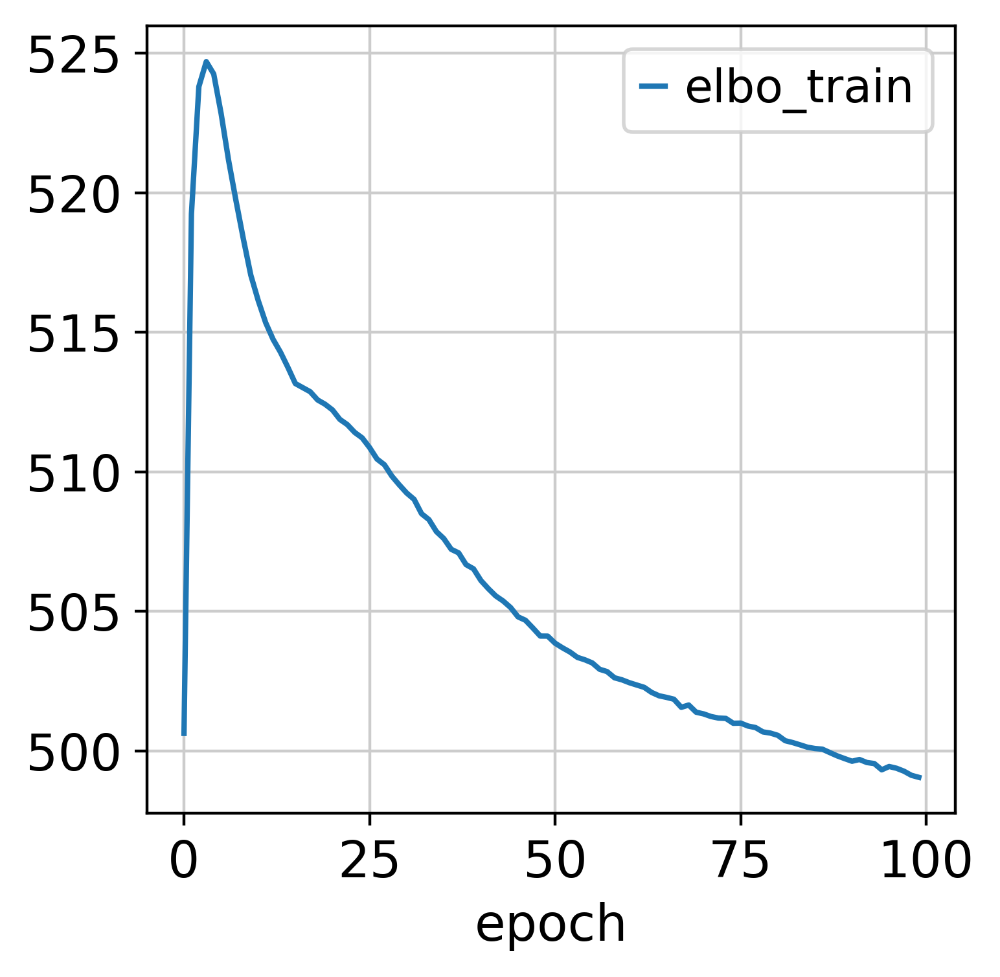

In [34]:
scanvi_model.history["elbo_train"].plot()

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              
May 23 09:10:11 AM: Your dataset appears to contain duplicated items (rows); when embedding, you should typically have unique items.
May 23 09:10:11 AM: The following items have duplicates [4008 4067 4085 4171 4192 4215 4867 5171 5486 5584 6901 7046 7076 7173
 7196 8091 8534 8758]


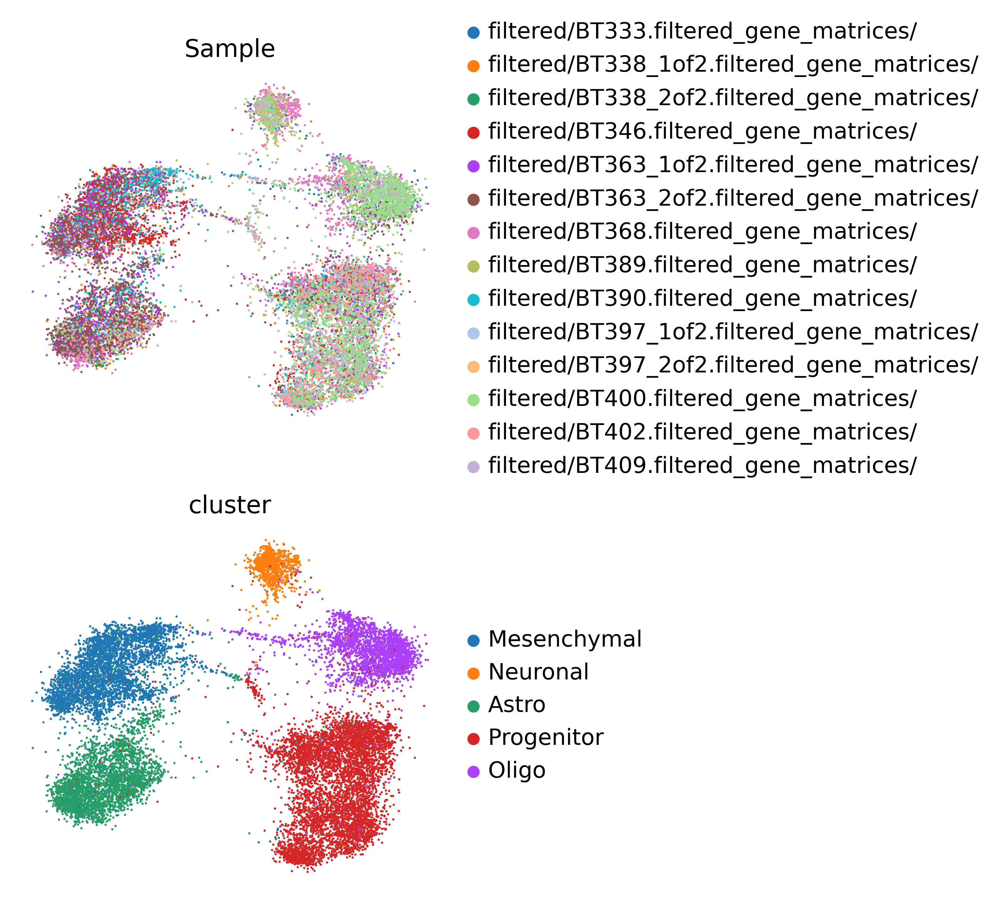

In [35]:
SCANVI_LATENT_KEY = "X_scANVI"

ref_adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation()
#sc.pp.neighbors(ref_adata, use_rep=SCANVI_LATENT_KEY)
#sc.tl.leiden(ref_adata)
#sc.tl.umap(ref_adata)
SCANVI_MDE_KEY = "X_scANVI_MDE"
ref_adata.obsm[SCANVI_MDE_KEY] = scvi.model.utils.mde(ref_adata.obsm[SCANVI_LATENT_KEY])
sc.pl.embedding(
    ref_adata, basis=SCANVI_MDE_KEY, color=["Sample", "cluster"], ncols=1, frameon=False
)

In [36]:
sc.pp.neighbors(ref_adata, use_rep="X_scANVI")
sc.tl.leiden(ref_adata)
sc.tl.umap(ref_adata)

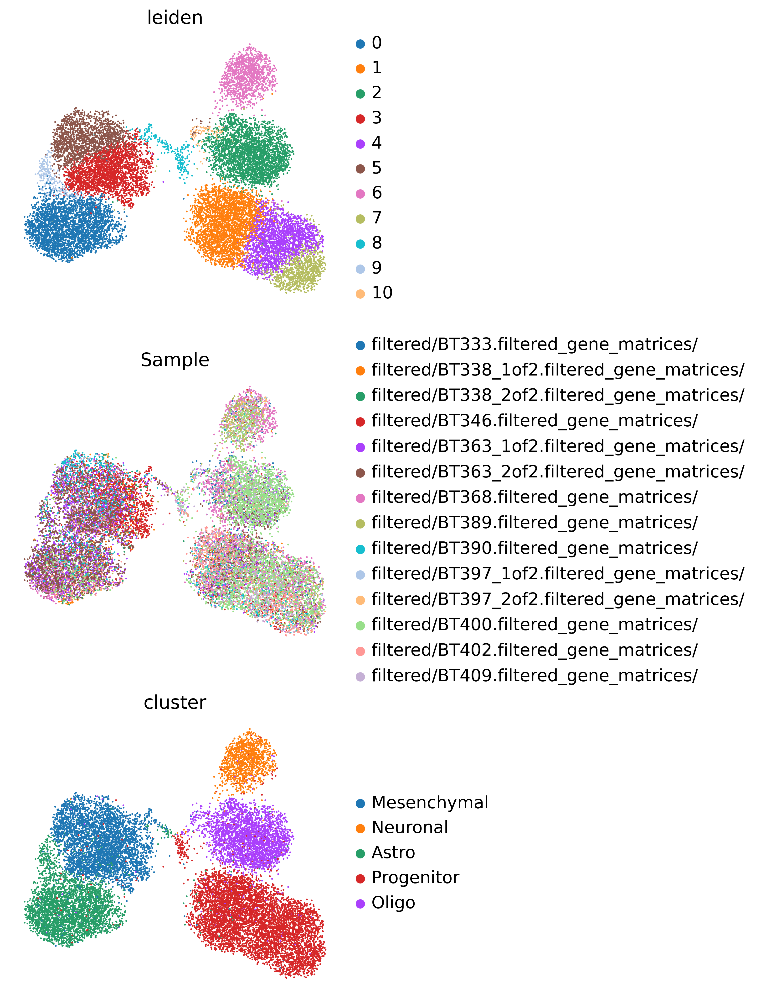

In [37]:
sc.pl.umap(
    ref_adata, color=["leiden", "Sample", "cluster"], ncols=1, frameon=False
)

In [38]:
old_to_new = {
    '0':'astro',
    '3':'mes',
    '5':'mes',
    '6':'neuro',
    '2':'oligo',
    '1':'prog',
    '4':'prog',
    '7':'prog',
    '8':'intermediate',
    '9':'intermediate_astro/mes',
    '10':'intermediate_oligo'
}
ref_adata.obs['anno_new'] = (ref_adata.obs['leiden'].map(old_to_new).astype('category'))

In [63]:
ref_adata.var_names = ref_adata.var["Symbol"].copy()

/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:864: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


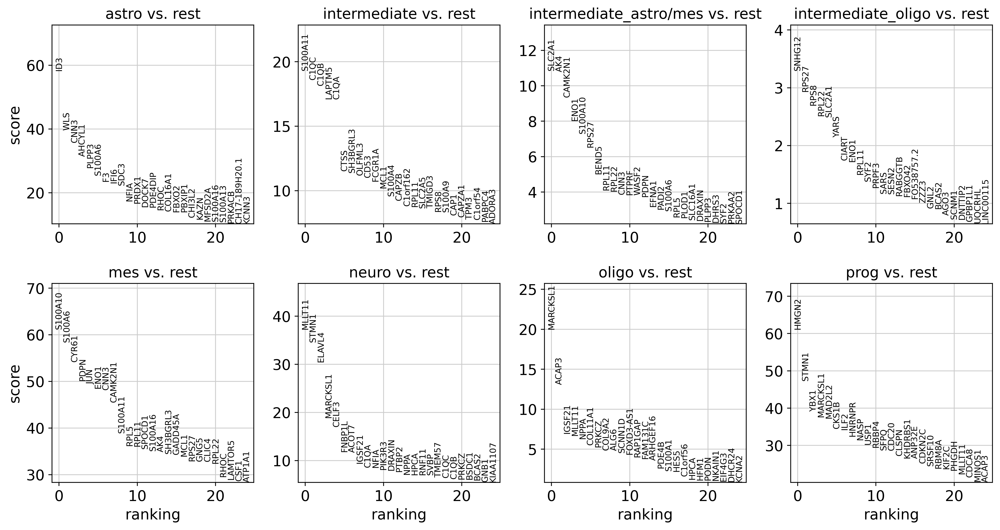

In [64]:
# sc.pp.log1p(ref_adata)
sc.tl.rank_genes_groups(ref_adata, "anno_new", method="wilcoxon")
sc.pl.rank_genes_groups(ref_adata, n_genes=25, sharey=False)

In [71]:
df = sc.get.rank_genes_groups_df(ref_adata, group="intermediate")
df
df.to_csv("/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/intermediate.csv")

In [ ]:
df

In [16]:
scanvi_model.save("/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/models/scanvi", overwrite=True)

In [17]:
scvi.model.SCANVI.prepare_query_anndata(target_adata, scanvi_model)

INFO     Found 4.9% reference vars in query data.                                                                  


/tmp/ipykernel_22994/2744302515.py:1: UserWarning: Query data contains less than 80% of reference var names. This may result in poor performance.
  scvi.model.SCANVI.prepare_query_anndata(target_adata, scanvi_model)


In [18]:
target_adata.obs["cluster"] = scanvi_model.unlabeled_category_
target_adata.obs["Sample"] = "GL0095_PDN"

scanvi_query = scvi.model.SCANVI.load_query_data(target_adata, "/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/models/scanvi")

INFO     File /vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/models/scanvi/model.pt already         
         downloaded                                                                                                


/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/scvi/data/_manager.py:209: UserWarning: Missing labels key labels_scanvi. Filling in with unlabeled category unknown.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/scvi/model/_scanvi.py:139: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


In [19]:
scanvi_query.train(
    max_epochs=250,
    plan_kwargs={"weight_decay": 0.0},
    early_stopping = False,
    check_val_every_n_epoch=10,
)

INFO     Training for 250 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:293: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 10/250:   4%| | 9/250 [00:00<00:19, 12.62it/s, v_num=1, train_loss_step=23

/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 250/250: 100%|█| 250/250 [00:21<00:00, 10.81it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|█| 250/250 [00:21<00:00, 11.65it/s, v_num=1, train_loss_step


<Axes: xlabel='epoch'>

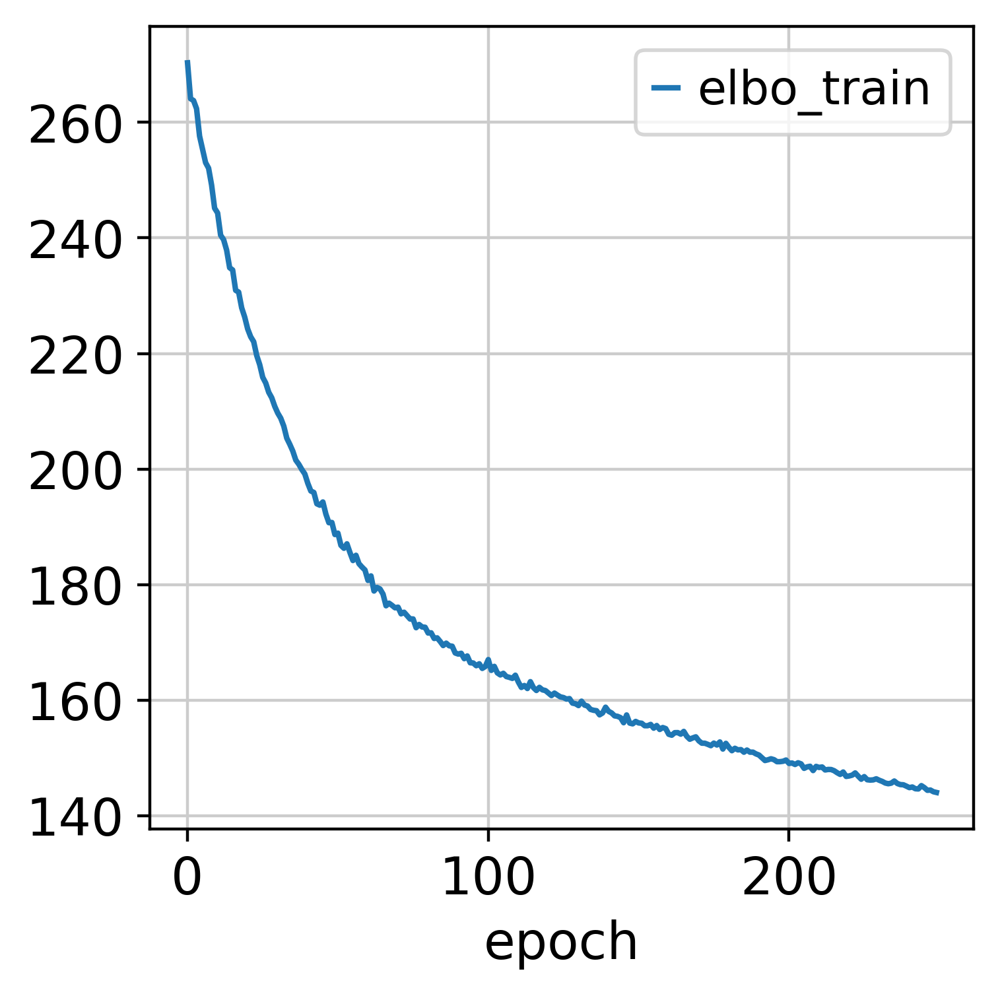

In [20]:
scanvi_query.history["elbo_train"].plot()

In [21]:
SCANVI_PREDICTIONS_KEY = "predictions_scanvi"

target_adata.obsm[SCANVI_LATENT_KEY] = scanvi_query.get_latent_representation()
target_adata.obs[SCANVI_PREDICTIONS_KEY] = scanvi_query.predict()

In [22]:
import anndata
full_adata = anndata.concat([target_adata, ref_adata], label="batch")
full_adata

AnnData object with n_obs × n_vars = 18813 × 2000
    obs: 'cluster', 'Sample', '_scvi_batch', 'labels_scanvi', '_scvi_labels', 'batch'
    obsm: 'X_scANVI'
    layers: 'counts'

In [23]:
full_predictions = scanvi_query.predict(full_adata)
print(f"Acc: {np.mean(full_predictions == full_adata.obs['cluster'])}")

full_adata.obs[SCANVI_PREDICTIONS_KEY] = full_predictions

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


Acc: 0.9133577845107107

In [24]:
# sc.pp.neighbors(full_adata, use_rep=SCANVI_LATENT_KEY)
 #sc.tl.leiden(full_adata)
# sc.tl.umap(full_adata)

In [25]:
# sc.pl.umap(
#    full_adata,
#    color=["Sample", "cluster"],
#    frameon=False,
#    ncols=1,
#)

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              
May 22 04:43:56 PM: Your dataset appears to contain duplicated items (rows); when embedding, you should typically have unique items.
May 22 04:43:56 PM: The following items have duplicates [   17    69    80   111   113   115   235   315   370   408   452   581
   582   623   700   716   744   751   787   864   868   946   999  4478
  4692  4737  5194  5271  5357  5378  5590  6553  6654  6770  7212  7397
  7483  7556  8158  8232  8359  8382  8706  9269  9944 10086 10239]


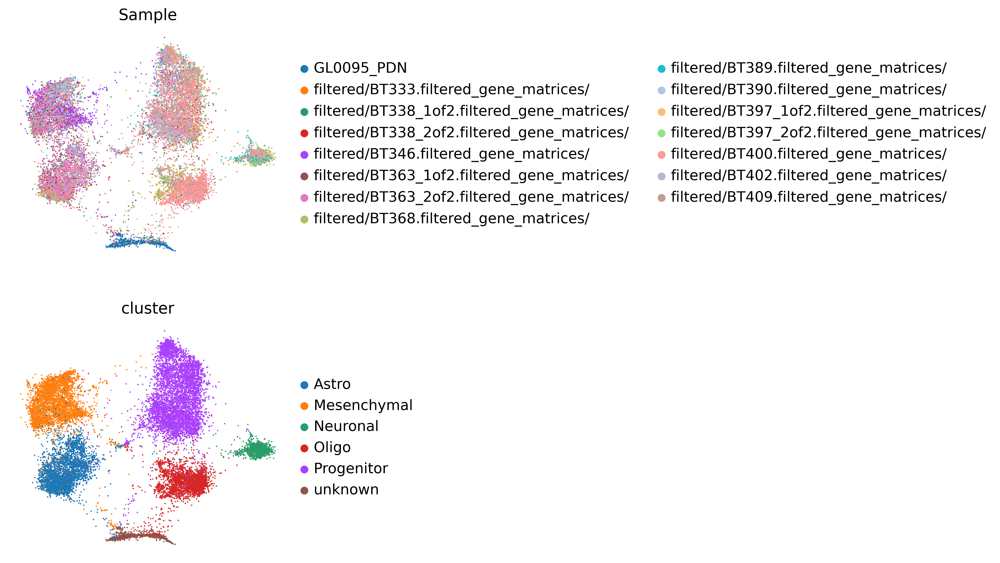

In [26]:
SCANVI_MDE_KEY = "X_scANVI_MDE"
full_adata.obsm[SCANVI_MDE_KEY] = scvi.model.utils.mde(full_adata.obsm[SCANVI_LATENT_KEY])
sc.pl.embedding(
    full_adata, basis=SCANVI_MDE_KEY, color=["Sample", "cluster"], ncols=1, frameon=False
)

/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


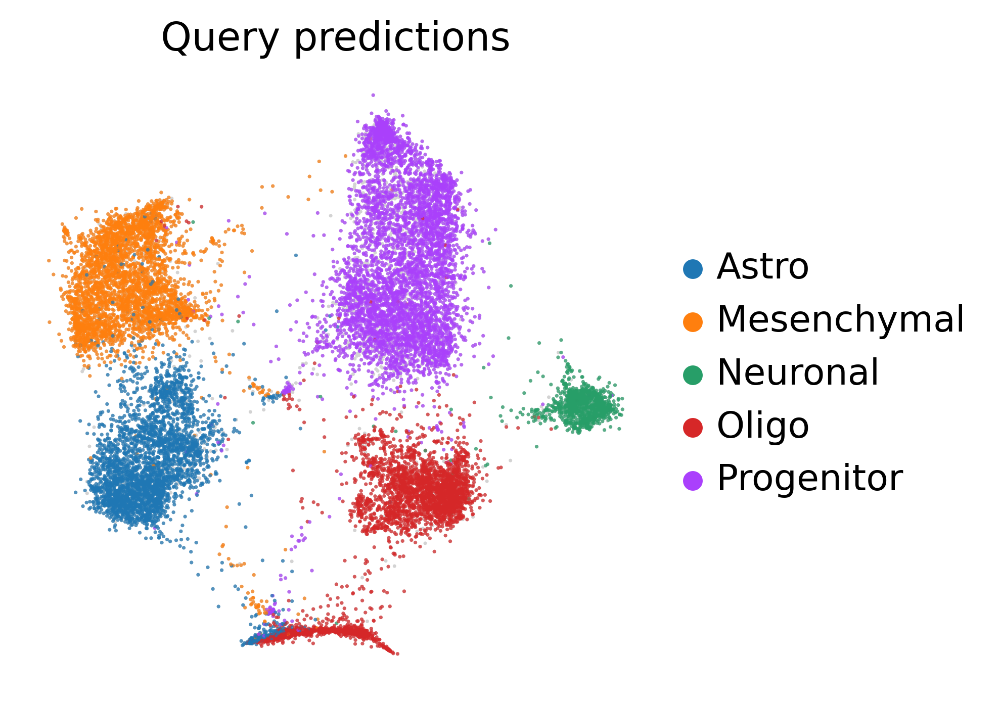

In [27]:
ax = sc.pl.embedding(
    full_adata,
    basis=SCANVI_MDE_KEY,
    frameon=False,
    show=False,
)
sc.pl.embedding(
    full_adata[: ref_adata.n_obs],
    basis=SCANVI_MDE_KEY,
    color=[SCANVI_PREDICTIONS_KEY],
    frameon=False,
    title="Query predictions",
    ax=ax,
    alpha=0.7,
)

In [28]:
#df = (
#    target_adata.obs.groupby(["cluster", SCANVI_PREDICTIONS_KEY])
#    .size()
#    .unstack(fill_value=0)
#)
#norm_df = df / df.sum(axis=0)#
#
#plt.figure(figsize=(8, 8))
#_ = plt.pcolor(norm_df)
#_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
#_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
#plt.xlabel("Predicted")
#plt.ylabel("Observed")

In [29]:
# scanvi_model.get_normalized_expression()

In [30]:
#denoised = scanvi_model.get_normalized_expression(ref_adata)

In [31]:
#denoised

In [32]:
#denoised = denoised.transpose()

In [33]:
#denoised

In [34]:
#denoised.to_csv("/vast/scratch/users/moore.z/pdo_pdn_comparison/data/processed/couturier_norm.csv")

In [35]:
target_adata

AnnData object with n_obs × n_vars = 1186 × 2000
    obs: 'bc_wells', 'sample', 'species', 'gene_count', 'tscp_count', 'mread_count', 'bc1_wind', 'bc2_wind', 'bc3_wind', 'bc1_well', 'bc2_well', 'bc3_well', 'sizeFactor', 'cluster', 'Sample', '_scvi_batch', 'labels_scanvi', '_scvi_labels', 'predictions_scanvi'
    var: 'gene_id', 'gene_name', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_scANVI'
    layers: 'logcounts', 'counts'

INFO     Using cuda:0 for `pymde.preserve_neighbors`.                                                              
May 22 04:44:00 PM: Your dataset appears to contain duplicated items (rows); when embedding, you should typically have unique items.
May 22 04:44:00 PM: The following items have duplicates [  17   48   69   73   80   91  107  112  113  114  115  142  187  198
  215  221  226  249  315  370  377  382  403  407  408  417  472  581
  582  623  700  744  751  787  868  946 1056 1100 1131 1169]


/home/users/allstaff/moore.z/.conda/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


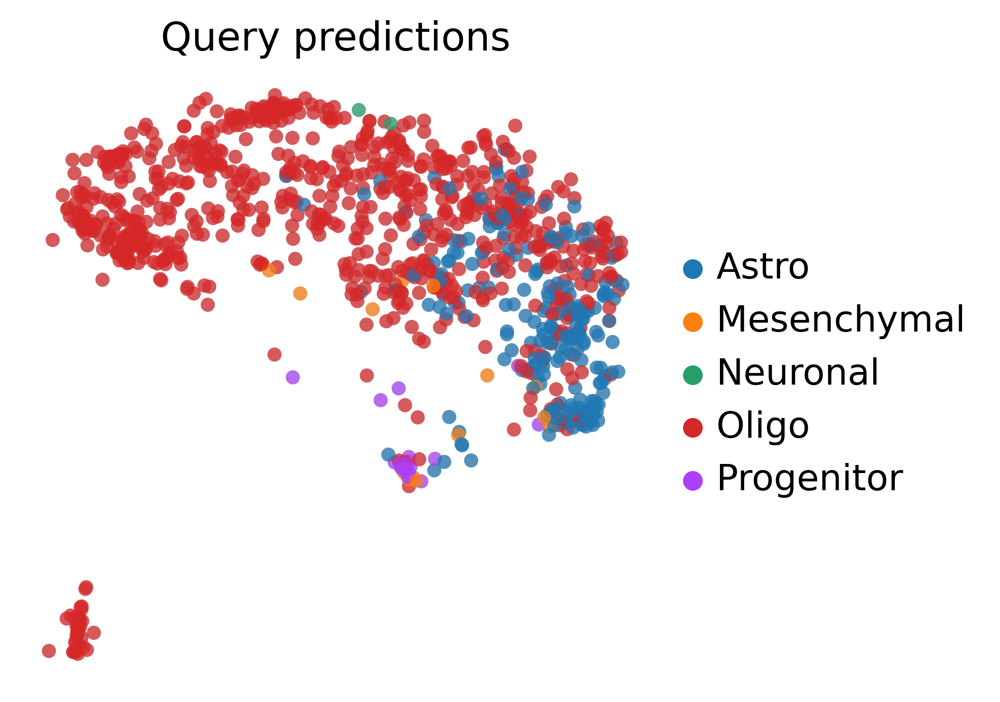

In [36]:
SCANVI_MDE_KEY = "X_scANVI_MDE"
target_adata.obsm[SCANVI_MDE_KEY] = scvi.model.utils.mde(target_adata.obsm[SCANVI_LATENT_KEY])

ax = sc.pl.embedding(
    target_adata,
    basis=SCANVI_MDE_KEY,
    frameon=False,
    show=False,
)
sc.pl.embedding(
    target_adata[: ref_adata.n_obs],
    basis=SCANVI_MDE_KEY,
    color=[SCANVI_PREDICTIONS_KEY],
    frameon=False,
    title="Query predictions",
    ax=ax,
    alpha=0.7,
)

In [37]:
target_adata.X

<1186x2000 sparse matrix of type '<class 'numpy.float64'>'
	with 13942 stored elements in Compressed Sparse Row format>